In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
df = pd.read_csv('lyrics.csv')
df = df[df['genre'] != 'Not Available']
df.head()

,index,song,year,artist,genre,lyrics
0,0,ego-remix,2009,beyonce-knowles,Pop,"Oh baby, how you doing?\nYou know I'm gonna cu..."
1,1,then-tell-me,2009,beyonce-knowles,Pop,"playin' everything so easy,\nit's like you see..."
2,2,honesty,2009,beyonce-knowles,Pop,If you search\nFor tenderness\nIt isn't hard t...
3,3,you-are-my-rock,2009,beyonce-knowles,Pop,"Oh oh oh I, oh oh oh I\n[Verse 1:]\nIf I wrote..."
4,4,black-culture,2009,beyonce-knowles,Pop,"Party the people, the people the party it's po..."


In [8]:
df.dropna(inplace=True)

count        11.000000
mean      22055.909091
std       31285.946006
min        2243.000000
25%        4295.000000
50%        7970.000000
75%       24304.500000
max      109235.000000
Name: genre, dtype: float64

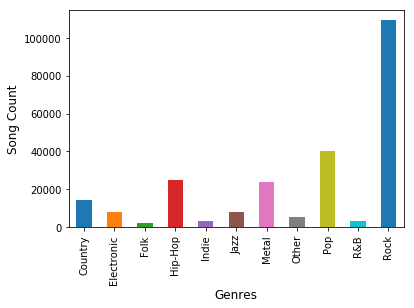

In [9]:
df_tmp = df.groupby(['genre']).aggregate({
    'genre' : 'count'
})['genre']

display(df_tmp.describe())
plot = df_tmp.plot.bar()
plot.set_xlabel("Genres", fontsize=12)
plot.set_ylabel("Song Count", fontsize=12)
plt.savefig('blah.png', dpi=1080)
plot

In [6]:
df_artist = df.groupby(['artist']).aggregate({
    'artist' : ['count']
})
df_artist = df_artist.sort_values([('artist','count')])

In [7]:
above_200_artists = df_artist[df_artist[('artist','count')] >= 200][('artist','count')].index

In [8]:
df[df['artist'].isin(above_200_artists)].groupby(['artist']).aggregate({'artist':['count']})

,artist
,count
artist,
2pac,367
50-cent,398
ac-dc,252
aerosmith,244
afi,202
air-supply,208
akon,273
alabama,276


In [9]:
len(df['artist'].unique())

14543

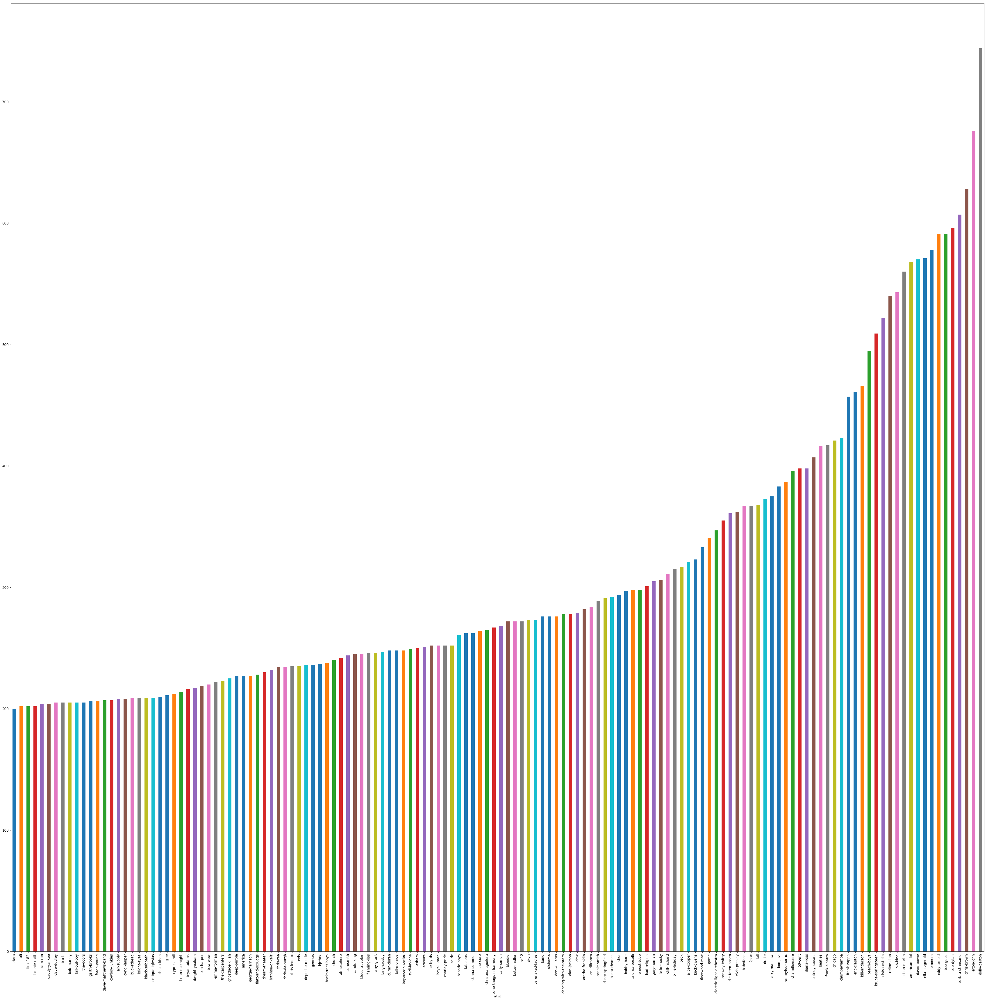

In [10]:
df_artist[df_artist[('artist','count')] >= 200][('artist','count')].plot.bar(figsize=(60,60), fontsize=12)

In [23]:
top_100_artists = df['artist'].value_counts()[:100].index

In [41]:
df_test = df[df['artist'].isin(top_100_artists)].groupby(['artist']).aggregate({'artist':['count']})
df_test.head()

,artist
,count
artist,
2pac,367
50-cent,398
ac-dc,252
aerosmith,244
akon,273


In [47]:
df_test = df_test.sort_values([('artist','count')])

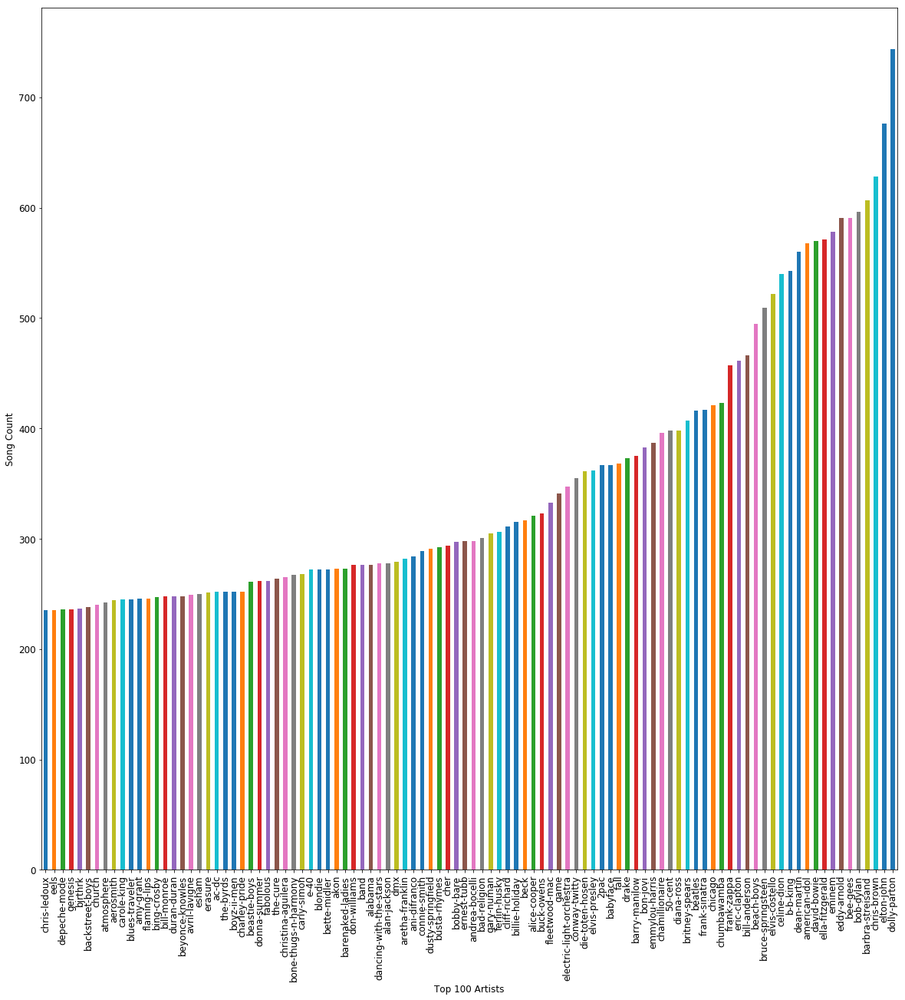

In [70]:
plot = df_test[('artist','count')].plot.bar(figsize=(20,20), fontsize=12)
plot.set_xlabel("Top 100 Artists", fontsize=12)
plot.set_ylabel("Song Count", fontsize=12)
plt.savefig('blah.png', dpi=1080)
plot

In [12]:
df['genre'].unique()

array(['Pop', 'Hip-Hop', 'Not Available', 'Rock', 'Metal', 'Other',
       'Country', 'Jazz', 'Electronic', 'Folk', 'R&B', 'Indie'],
      dtype=object)

In [13]:
genre_dfs = []

for genre in df['genre'].unique():
    genre_df = df[df['genre']==genre]
    genre_dfs.append(genre_df)

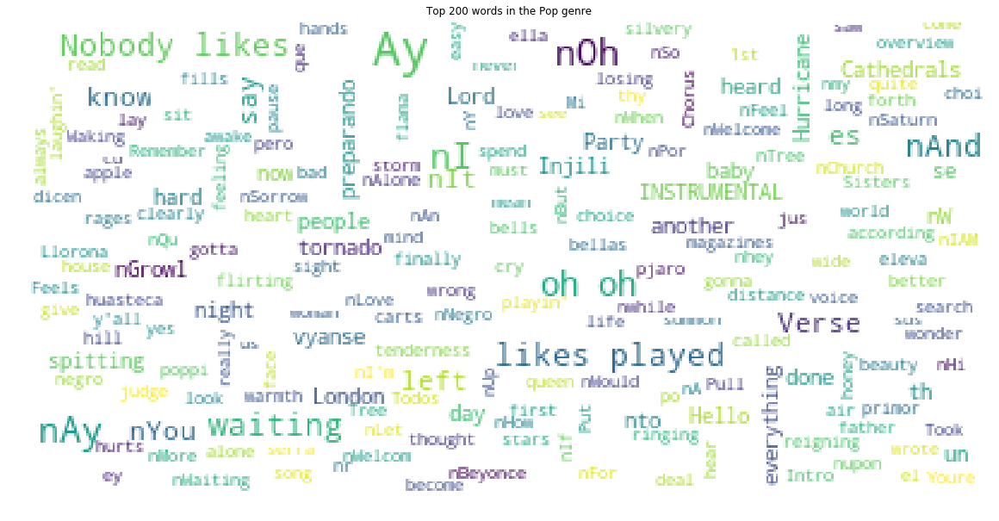

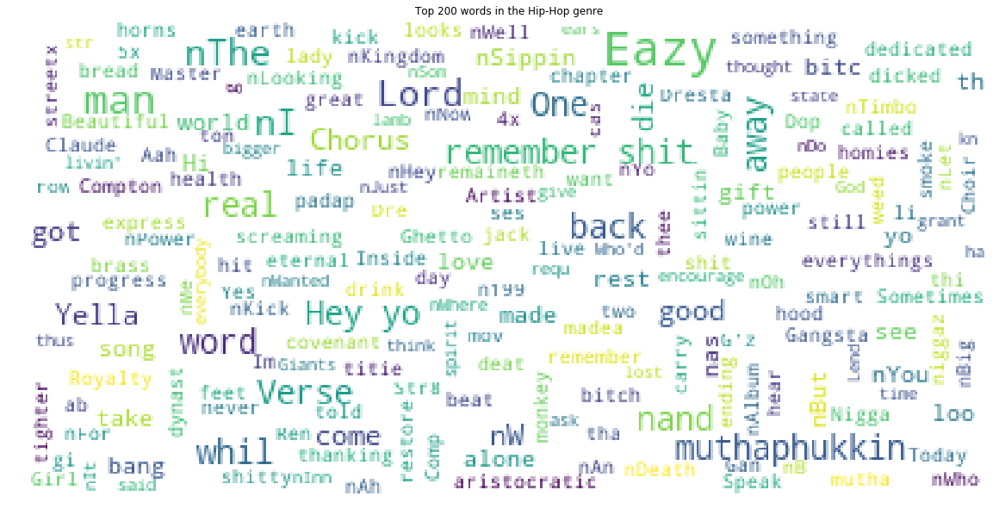

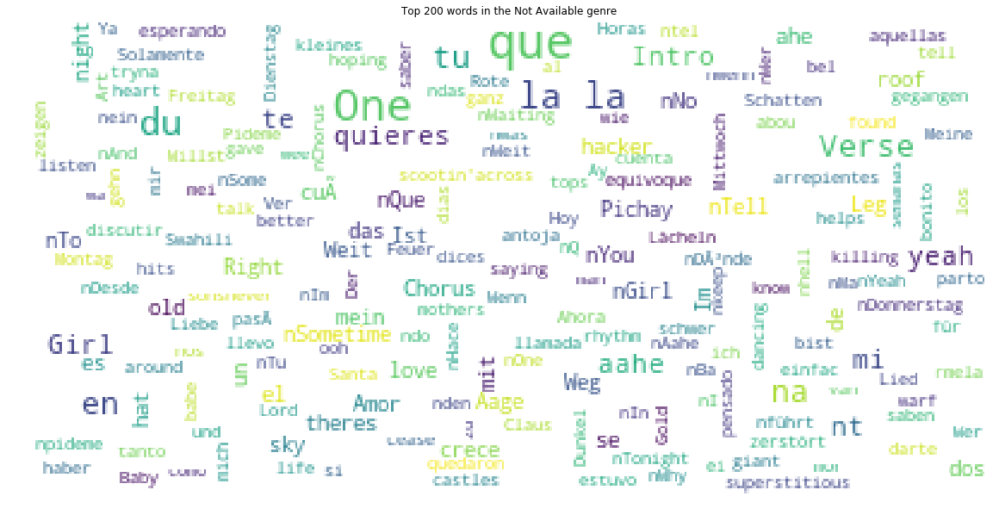

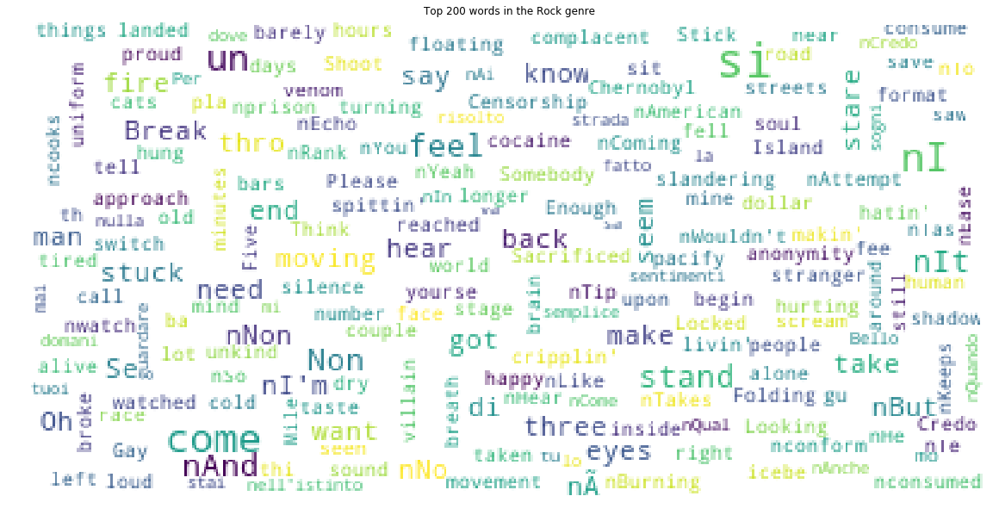

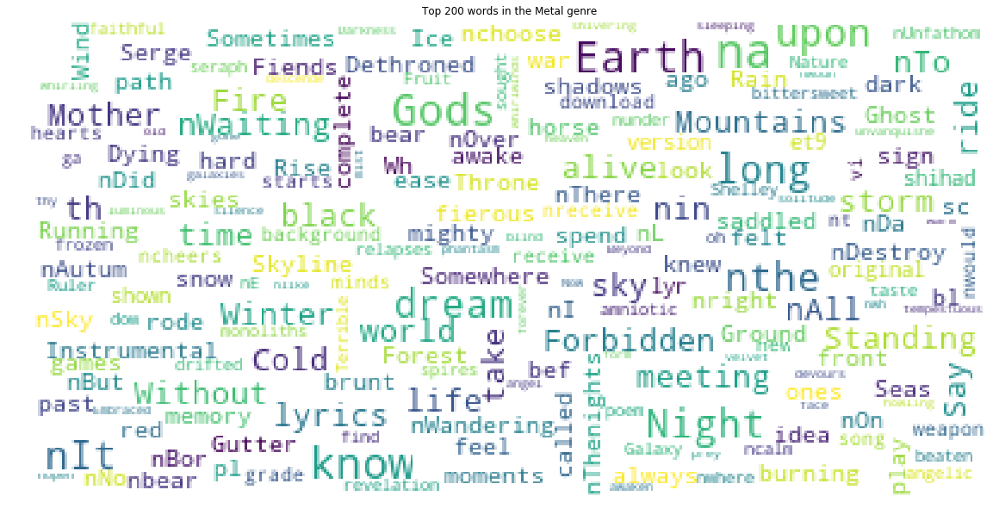

...

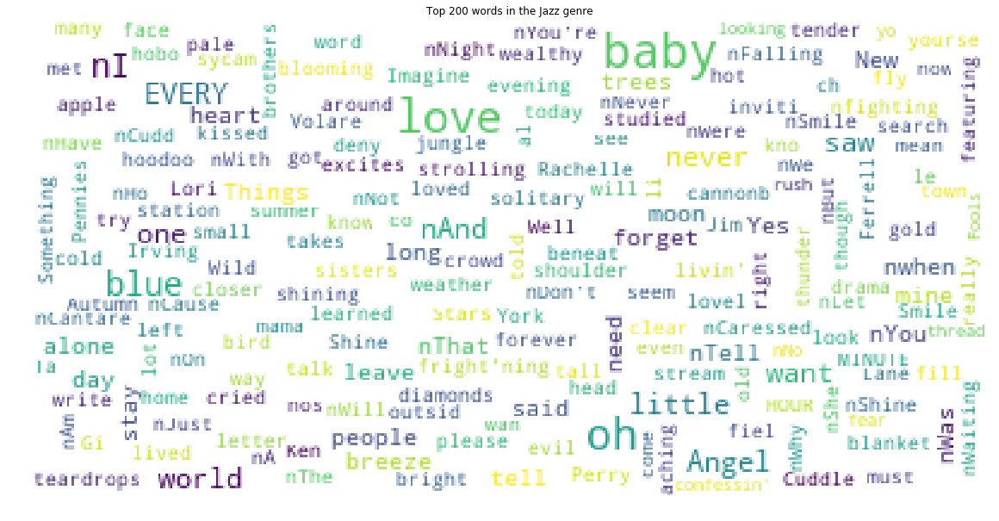

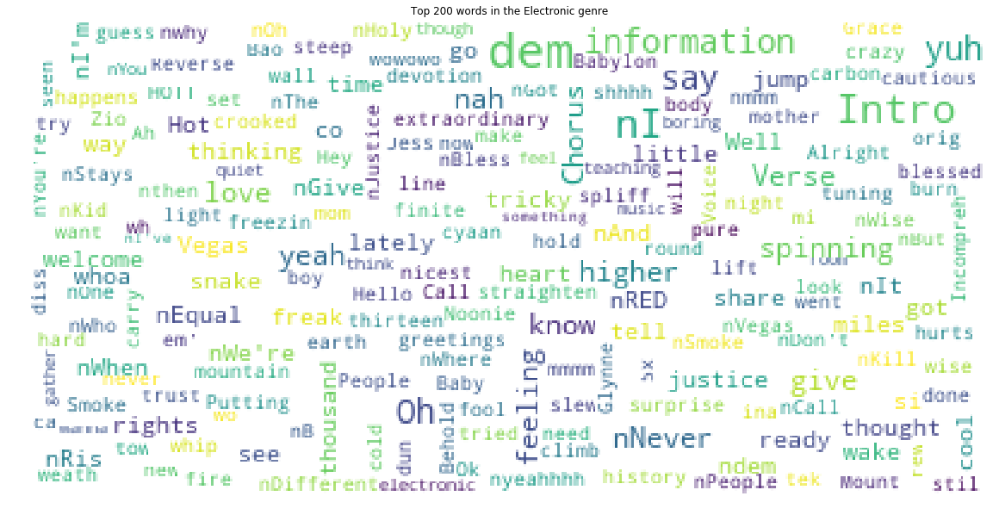

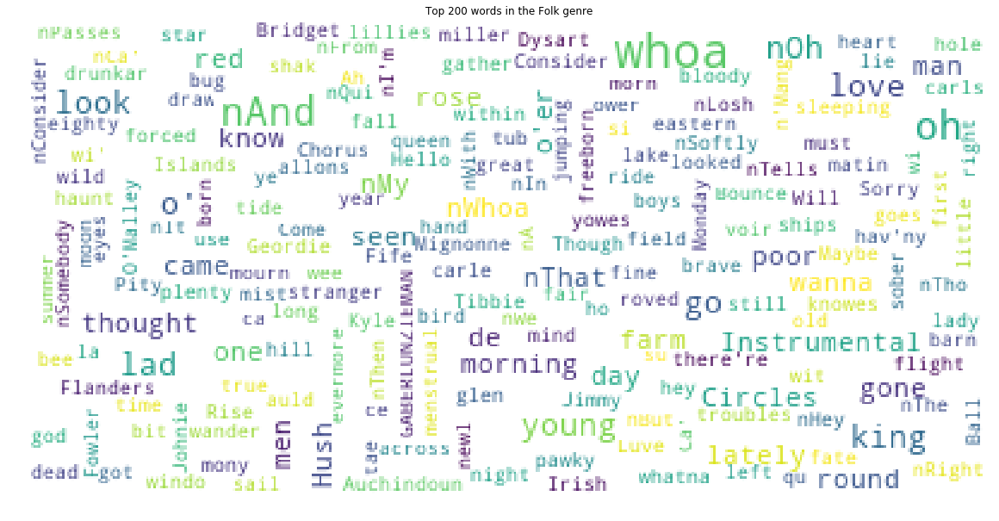

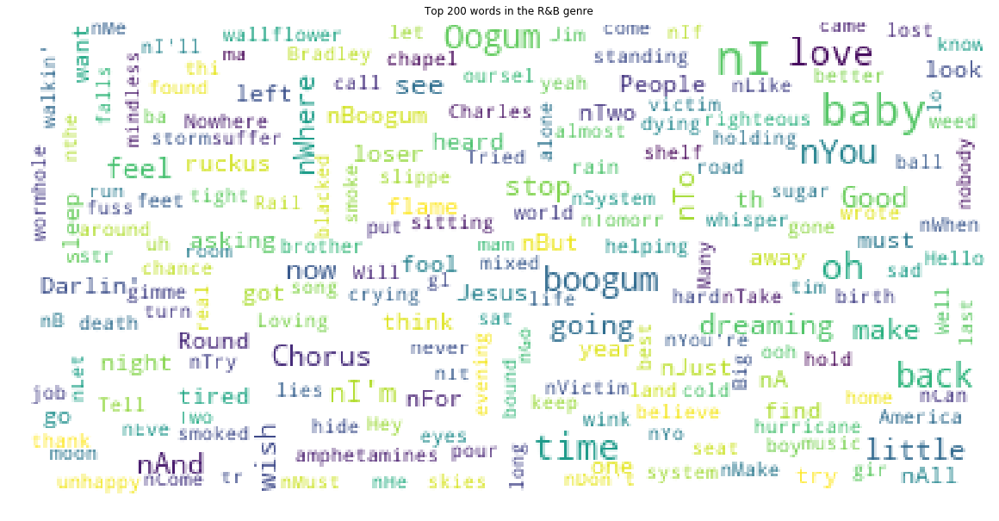

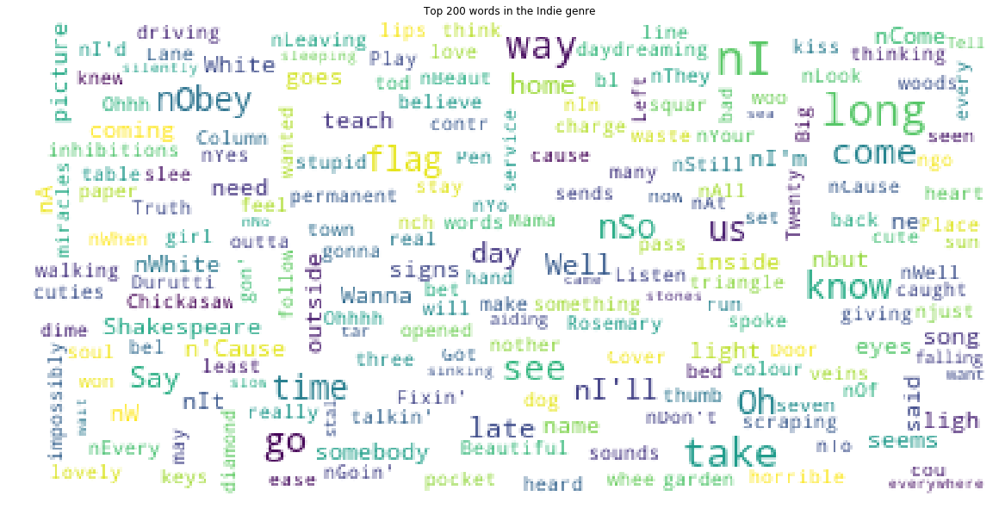

In [14]:
for ix, genre_df in enumerate(genre_dfs):
    import numpy as np
    import pandas as pd 
    import matplotlib as mpl
    import matplotlib.pyplot as plt
    %matplotlib inline

    from subprocess import check_output
    from wordcloud import WordCloud, STOPWORDS

    mpl.rcParams['figure.figsize']=(20.0,20.0)
    mpl.rcParams['font.size']=10                 
    mpl.rcParams['savefig.dpi']=1800             
    mpl.rcParams['figure.subplot.bottom']=.1 


    stopwords = set(STOPWORDS)
    stopwords = stopwords.union(['Beyonc'])

    wordcloud = WordCloud(
                              background_color='white',
                              stopwords=stopwords,
                              max_words=200,
                              max_font_size=20, 
                              random_state=42
                             ).generate(str(genre_df['lyrics']))

    print(wordcloud)
    fig = plt.figure(1)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title('Top 200 words in the ' + df['genre'].unique()[ix] + ' genre')
    plt.show()

In [15]:
top_artists_genre_dfs = []

for ix, genre_df in enumerate(genre_dfs):
    #print(df['genre'].unique()[ix] + ' genre')
    top_artists = list(genre_df.groupby(['artist']).aggregate({'artist' : 'count'})['artist'].sort_values(ascending=False).head(5).keys())
    #print(top_artists)
    top_artists_genre_df = genre_df[genre_df['artist'].isin(top_artists)]
    top_artists_genre_dfs.append(top_artists_genre_df)

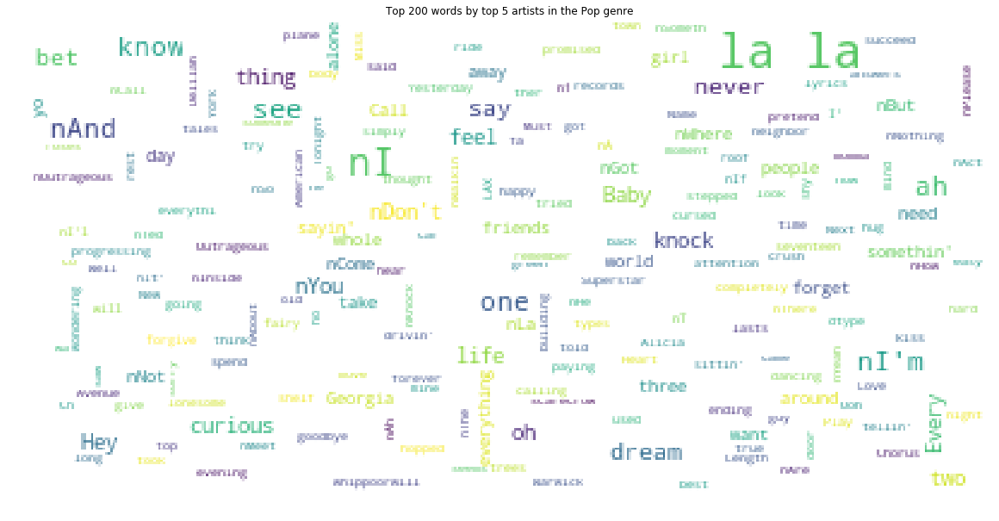

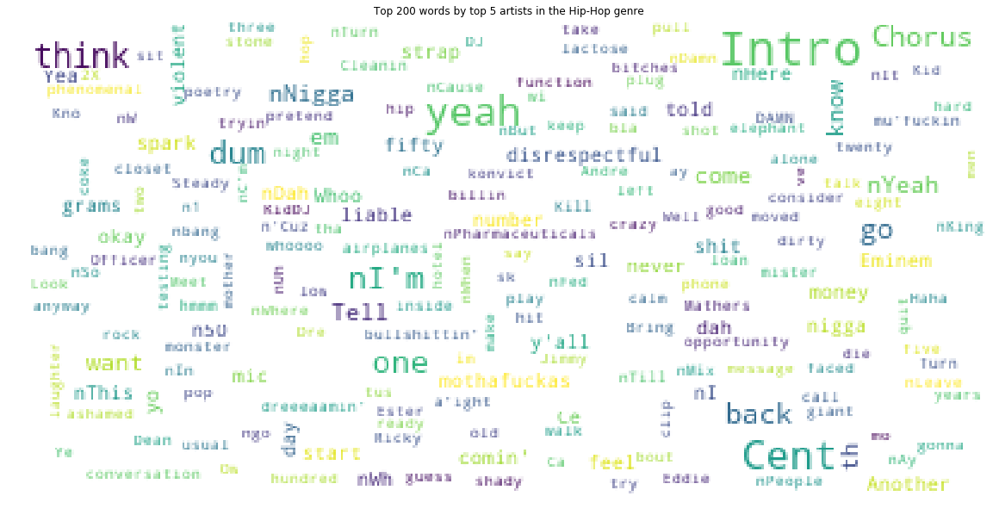

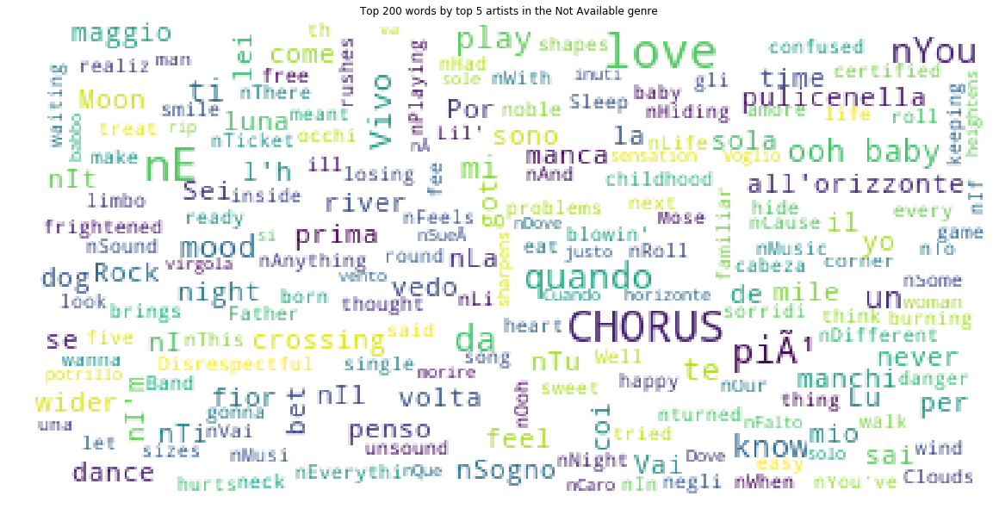

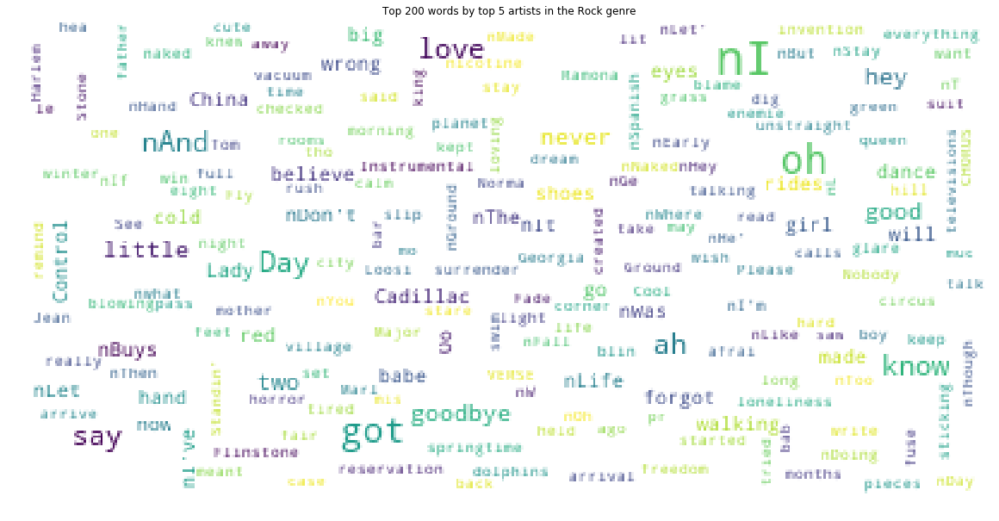

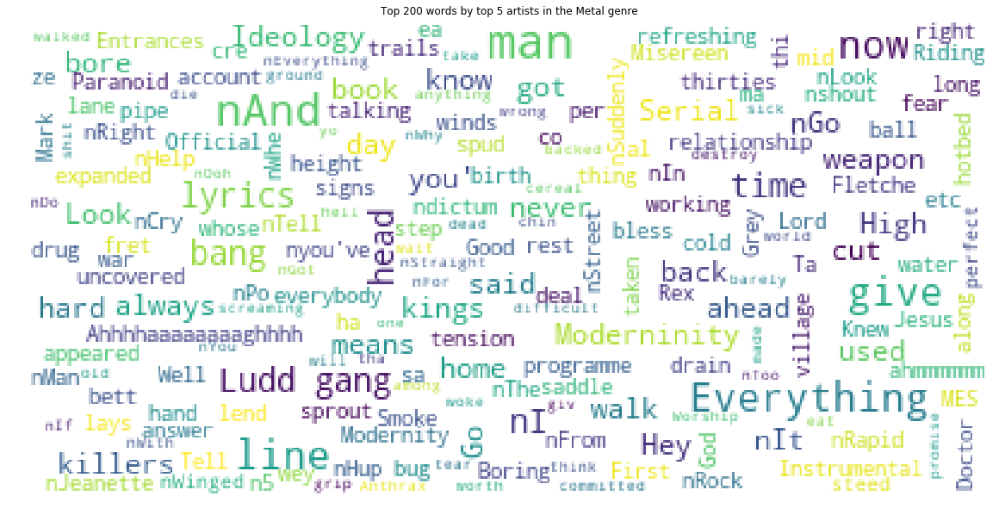

...

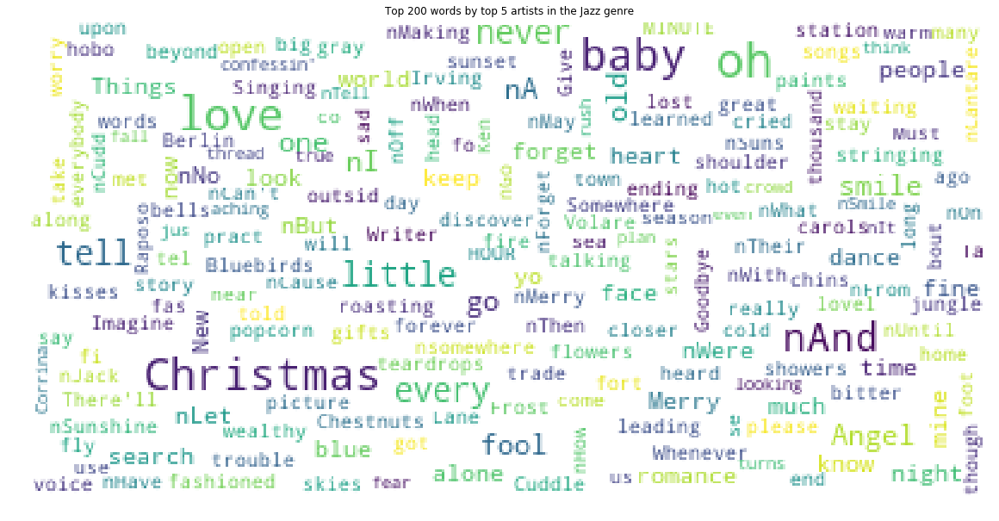

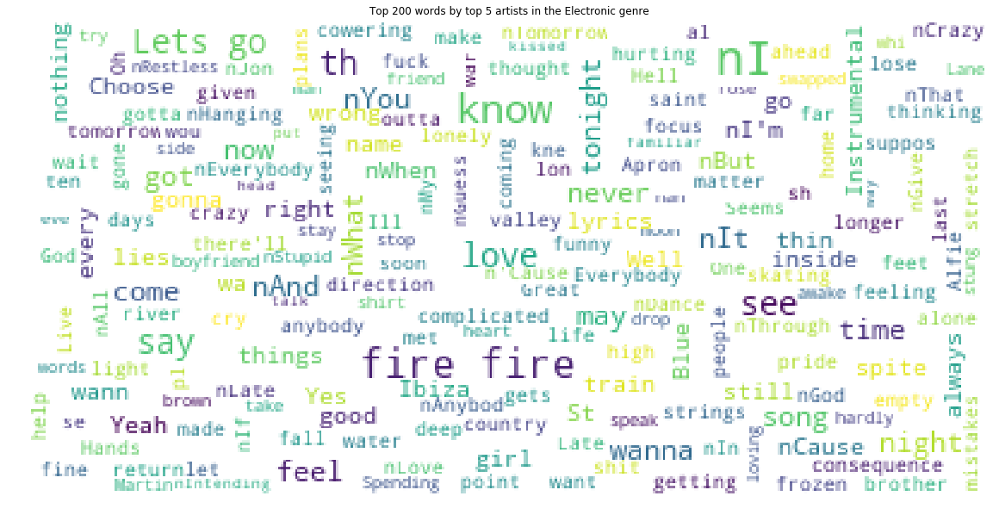

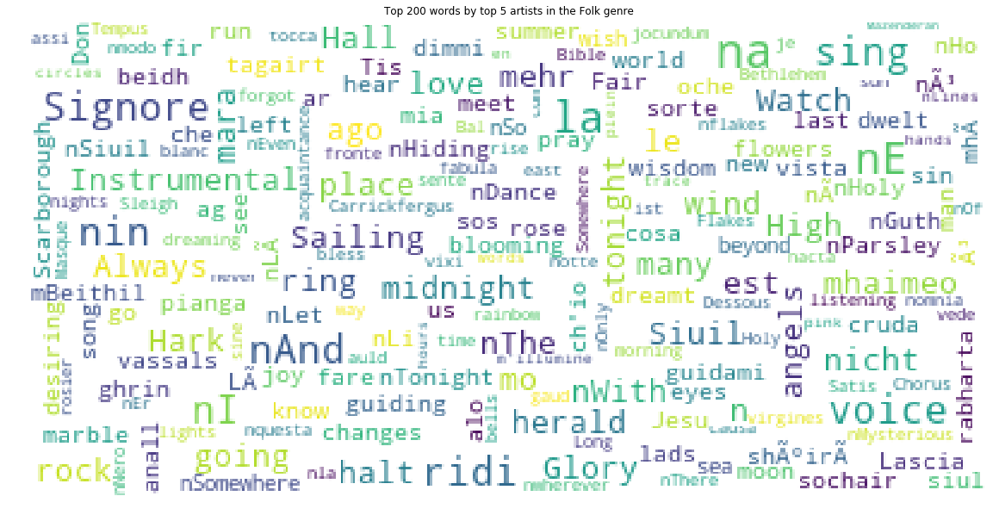

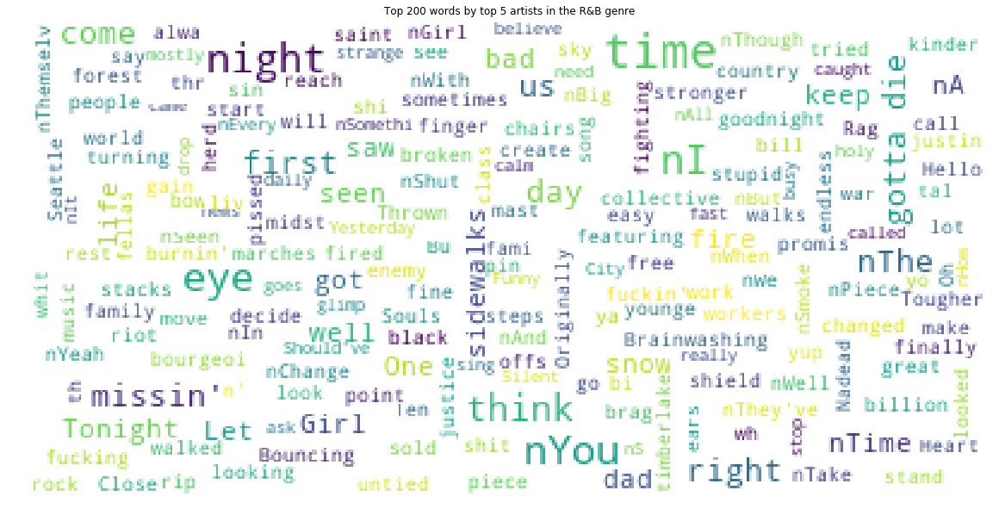

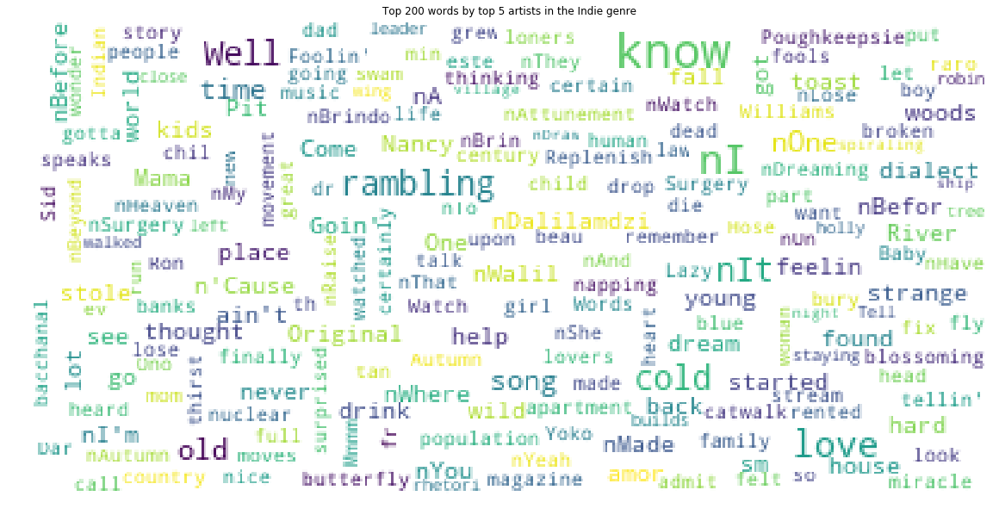

In [16]:
for ix, top_artists_genre_df in enumerate(top_artists_genre_dfs):
    import numpy as np
    import pandas as pd 
    import matplotlib as mpl
    import matplotlib.pyplot as plt
    %matplotlib inline

    from subprocess import check_output
    from wordcloud import WordCloud, STOPWORDS

    mpl.rcParams['figure.figsize']=(20.0,20.0)
    mpl.rcParams['font.size']=10                 
    mpl.rcParams['savefig.dpi']=800             
    mpl.rcParams['figure.subplot.bottom']=.1 


    stopwords = set(STOPWORDS)
    stopwords = stopwords.union(['Beyonc', 'David', 'Bowie', 'Riley'])

    wordcloud = WordCloud(
                              background_color='white',
                              stopwords=stopwords,
                              max_words=200,
                              max_font_size=20, 
                              random_state=42
                             ).generate(str(top_artists_genre_df['lyrics']))

    print(wordcloud)
    fig = plt.figure(1)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title('Top 200 words by top 5 artists in the ' + df['genre'].unique()[ix] + ' genre')
    plt.show()

In [17]:
best_artist_genre_dfs = []

for ix, genre_df in enumerate(genre_dfs):
    #print(df['genre'].unique()[ix])
    top_artist = genre_df.groupby(['artist']).aggregate({'artist' : 'count'})['artist'].sort_values(ascending=False).head(1).keys()[0]
    #print(top_artist)
    best_artist_genre_df = genre_df[genre_df['artist']==top_artist]
    best_artist_genre_dfs.append(best_artist_genre_df)

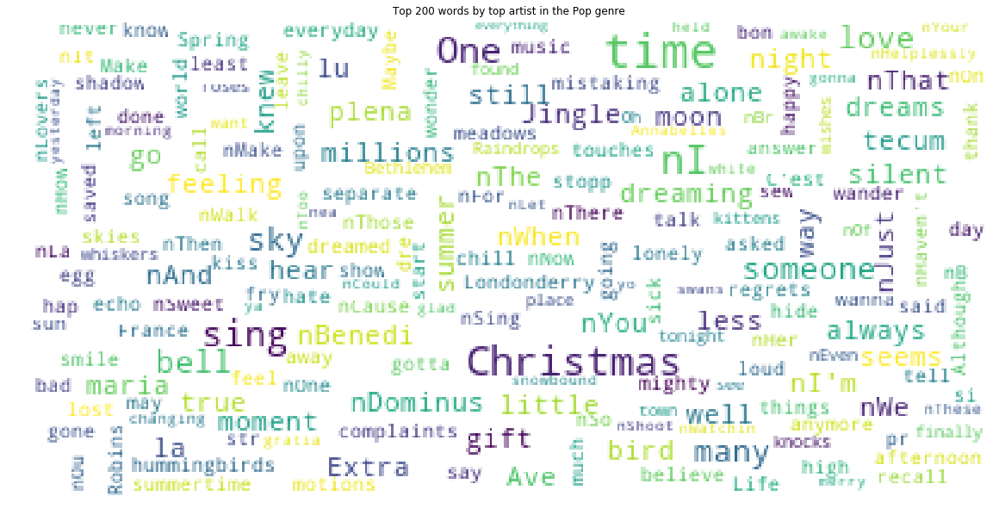

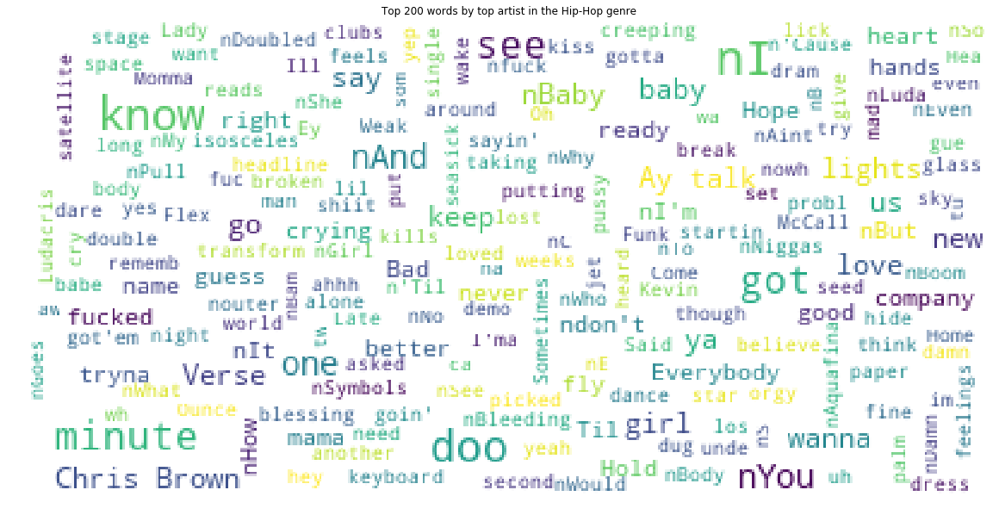

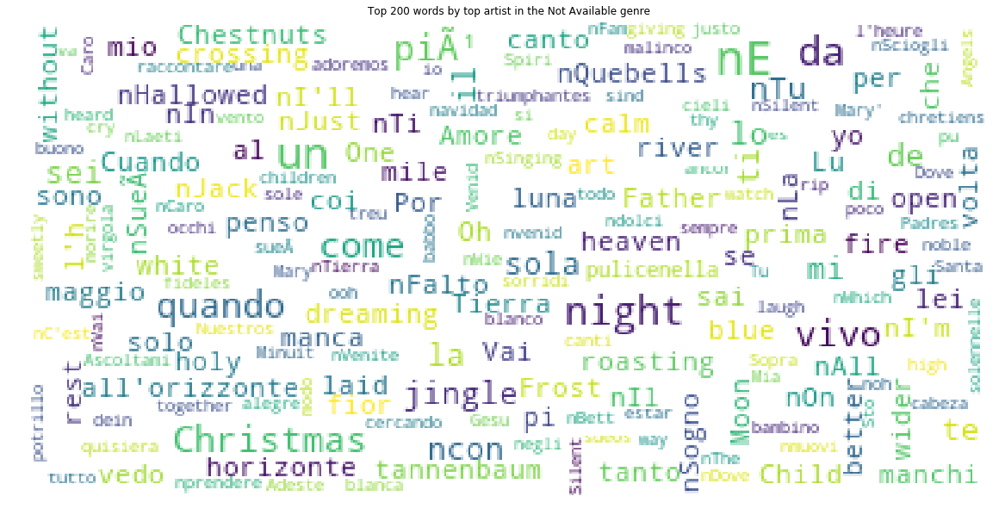

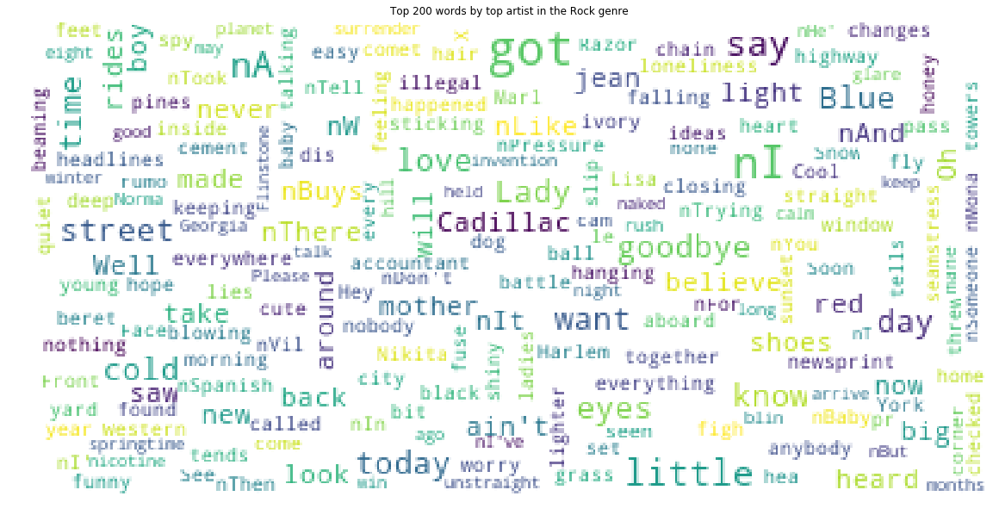

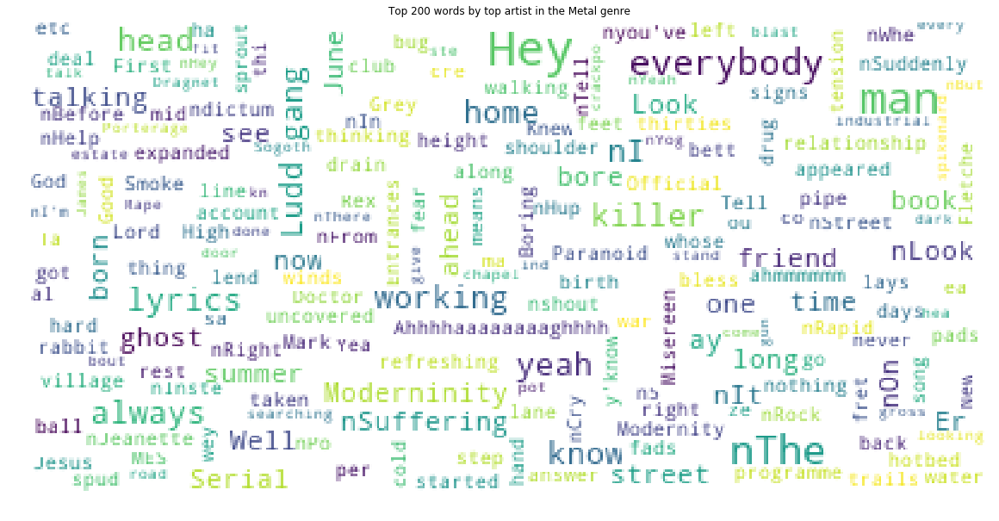

...

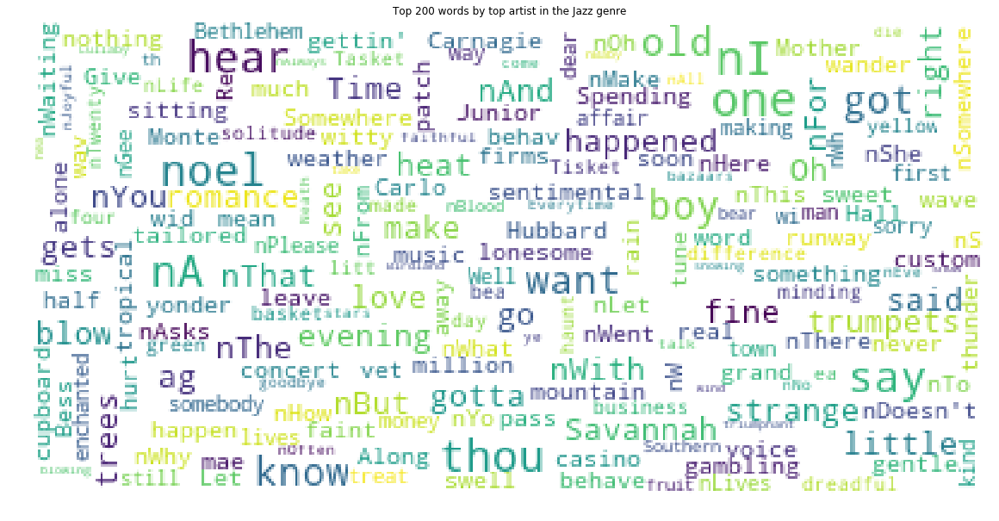

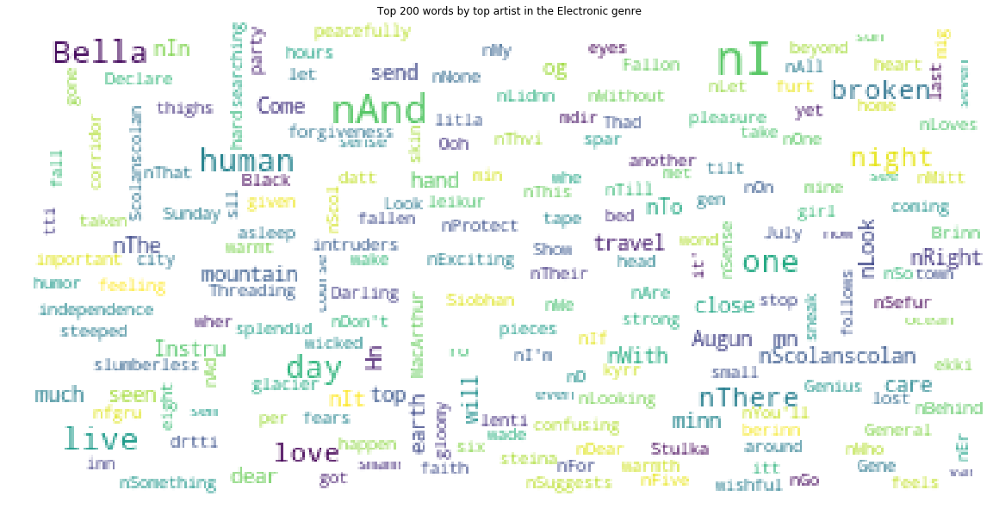

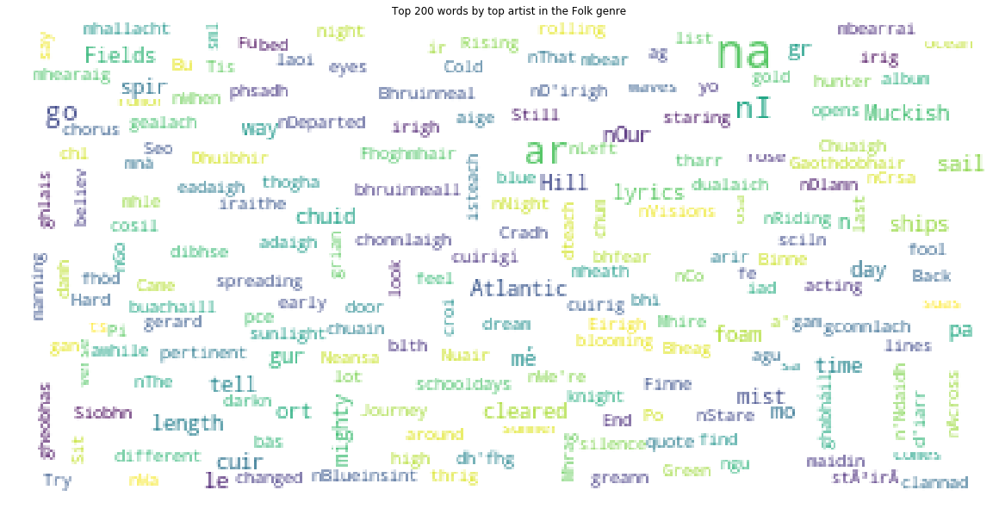

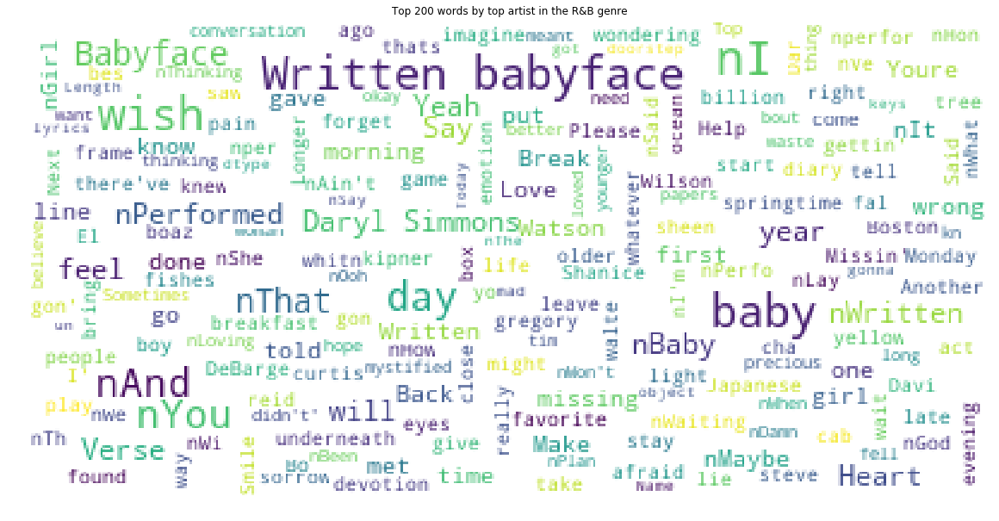

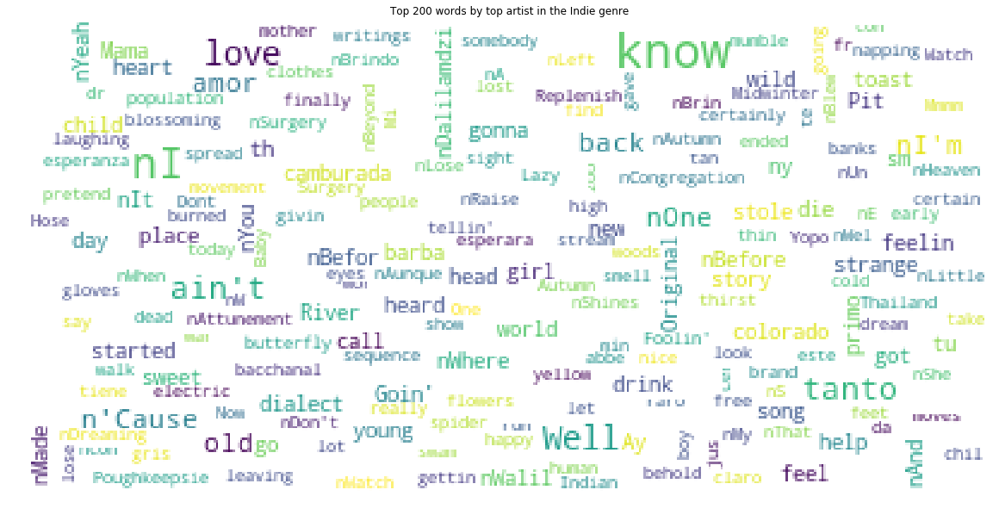

In [18]:
for ix, best_artist_genre_df in enumerate(best_artist_genre_dfs):
    import numpy as np
    import pandas as pd 
    import matplotlib as mpl
    import matplotlib.pyplot as plt
    %matplotlib inline

    from subprocess import check_output
    from wordcloud import WordCloud, STOPWORDS

    mpl.rcParams['figure.figsize']=(20.0,20.0)
    mpl.rcParams['font.size']=10                 
    mpl.rcParams['savefig.dpi']=800             
    mpl.rcParams['figure.subplot.bottom']=.1 


    stopwords = set(STOPWORDS)
    stopwords = stopwords.union(['Beyonc', 'David', 'Bowie', 'Riley', 'Dolly', 'Parton', 'Instrumental', 'INSTRUMENTAL'])

    wordcloud = WordCloud(
                              background_color='white',
                              stopwords=stopwords,
                              max_words=200,
                              max_font_size=20, 
                              random_state=42
                             ).generate(str(best_artist_genre_df['lyrics']))

    print(wordcloud)
    fig = plt.figure(1)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title('Top 200 words by top artist in the ' + df['genre'].unique()[ix] + ' genre')
    plt.show()

In [19]:
best_artist_genre_dfs = []

for ix, genre_df in enumerate(genre_dfs):
    #print(df['genre'].unique()[ix])
    top_artist = genre_df.groupby(['artist']).aggregate({'artist' : 'count'})['artist'].sort_values(ascending=False).head(1).keys()[0]
    second_artist = genre_df.groupby(['artist']).aggregate({'artist' : 'count'})['artist'].sort_values(ascending=False).head(2).keys()[1]
    third_artist = genre_df.groupby(['artist']).aggregate({'artist' : 'count'})['artist'].sort_values(ascending=False).head(3).keys()[2]
    #print(top_artist)
    best_artist_genre_df = genre_df[genre_df['artist']==top_artist]
    best_artist_genre_dfs.append(best_artist_genre_df)
    second_best_artist_genre_df = genre_df[genre_df['artist']==second_artist]
    best_artist_genre_dfs.append(second_best_artist_genre_df)
    third_best_artist_genre_df = genre_df[genre_df['artist']==third_artist]
    best_artist_genre_dfs.append(third_best_artist_genre_df)

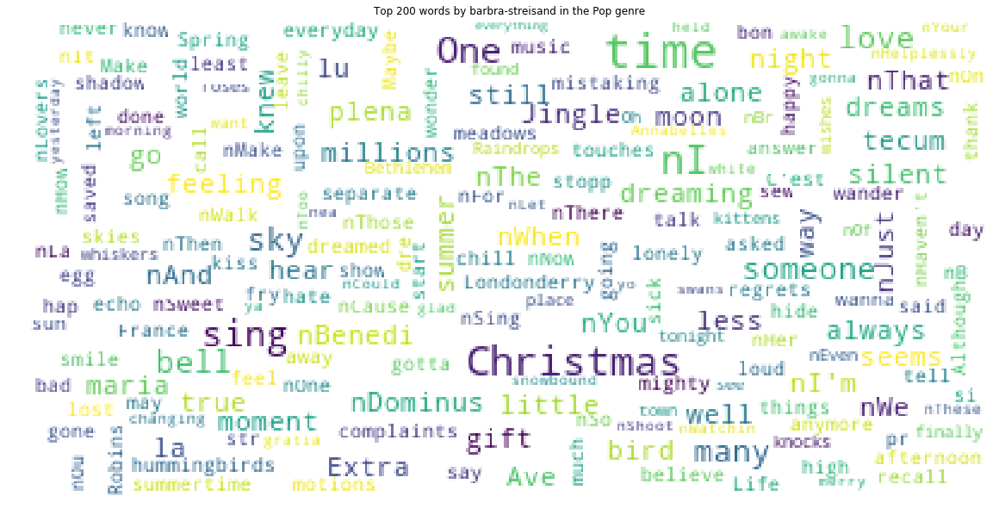

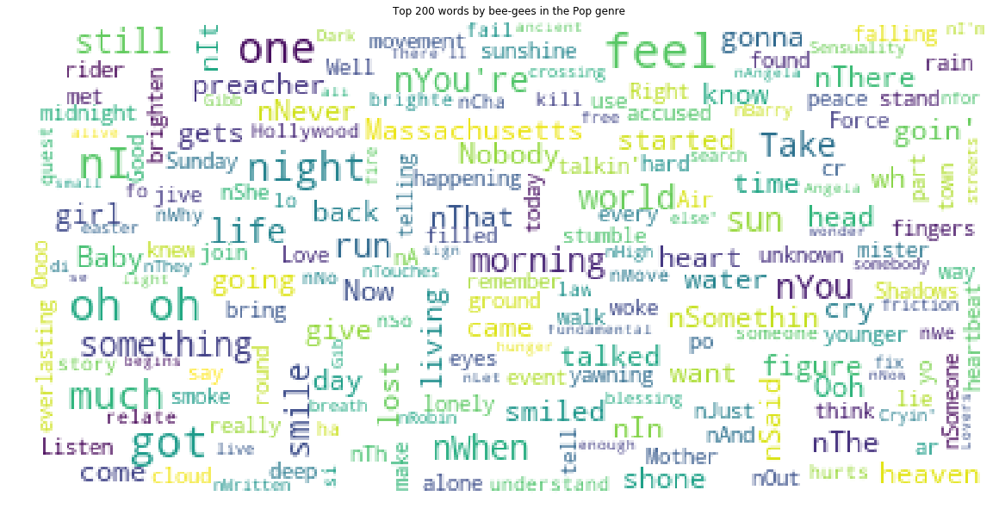

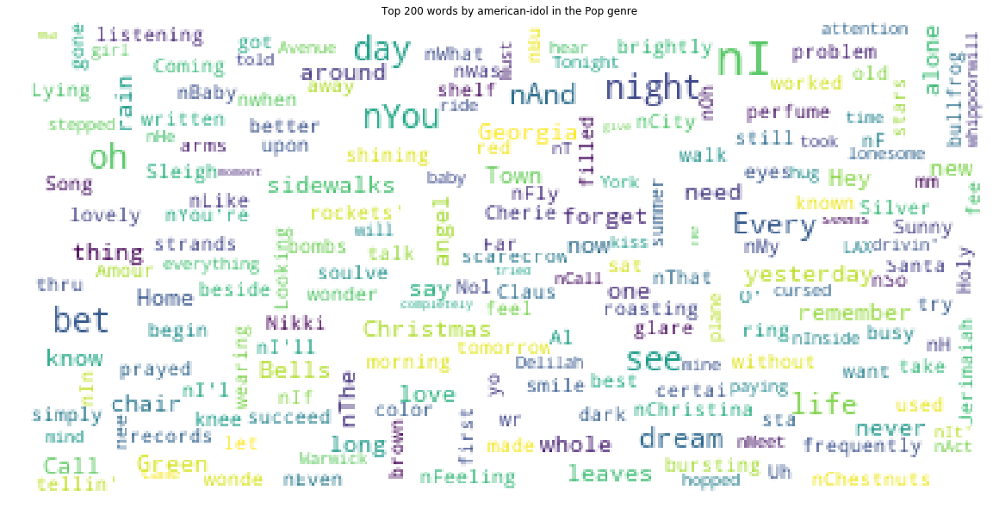

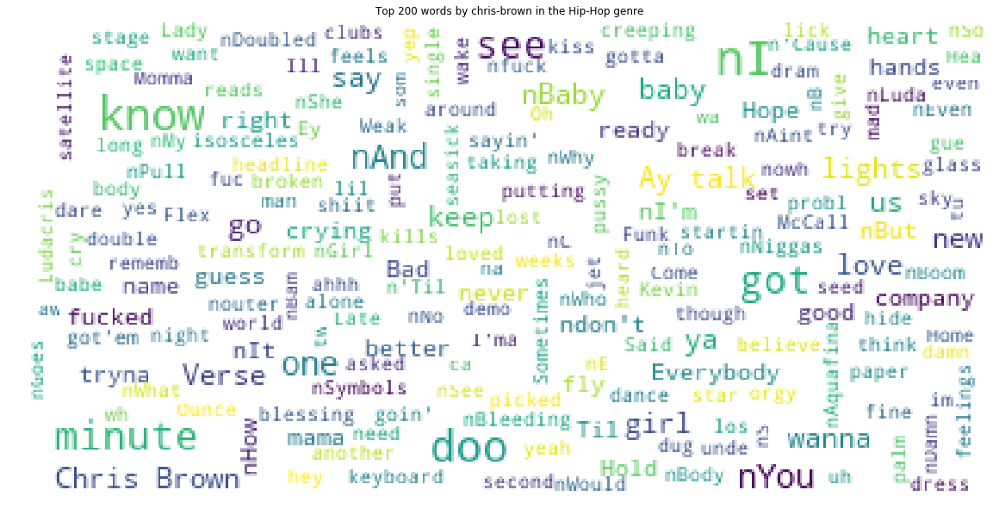

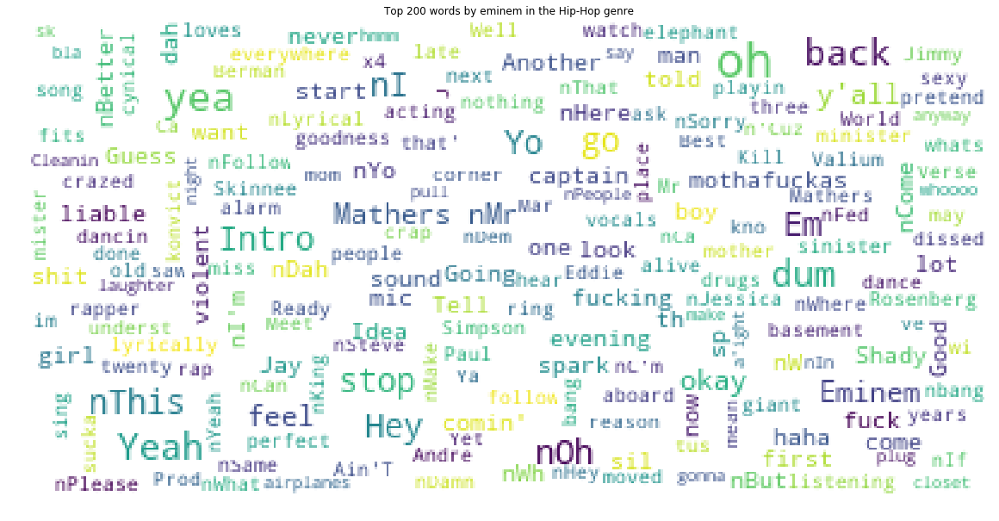

...

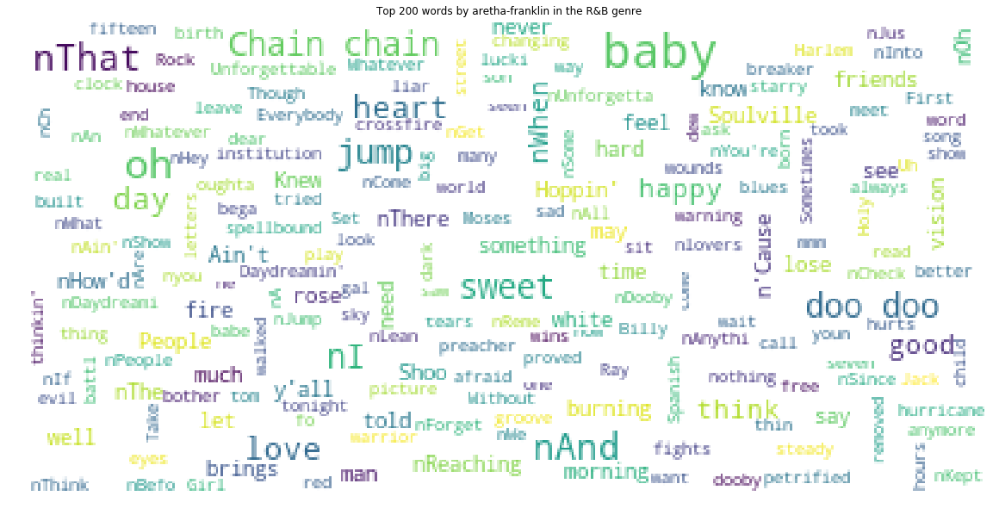

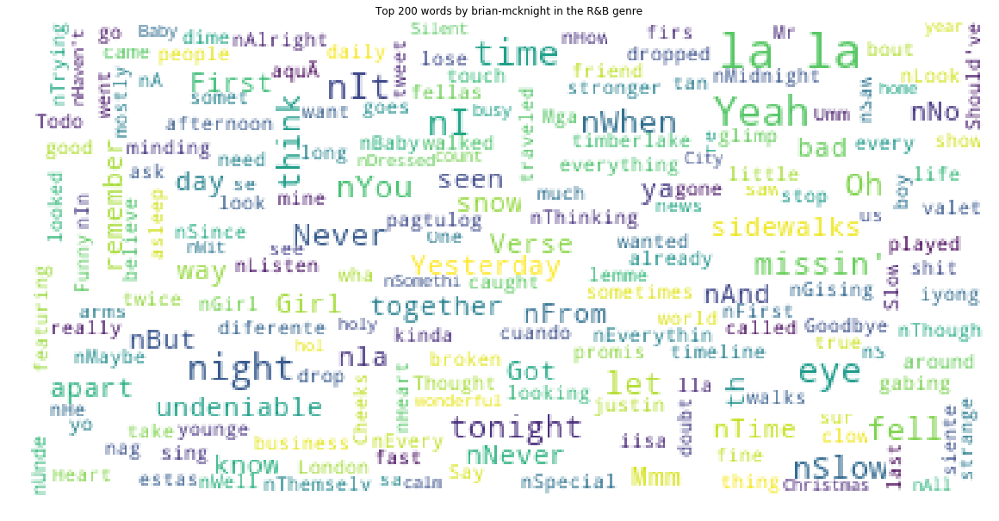

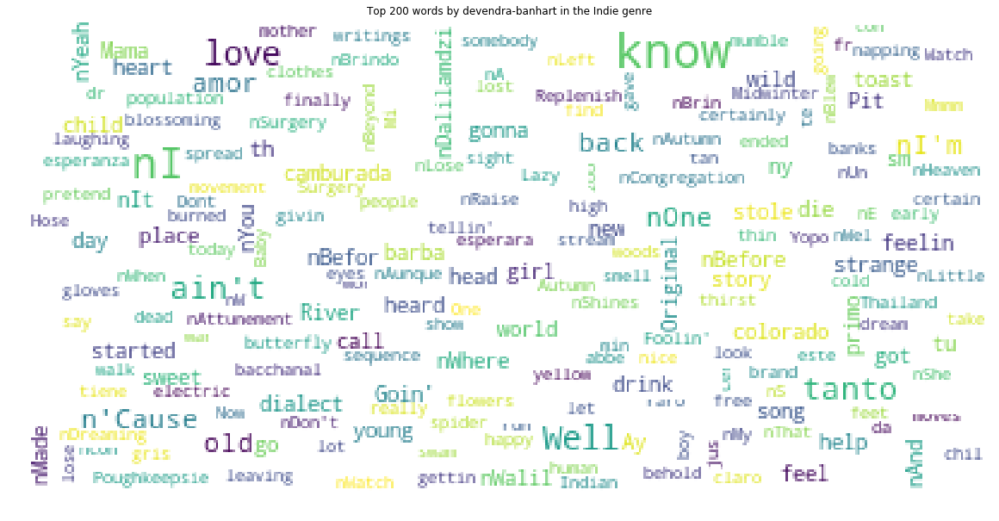

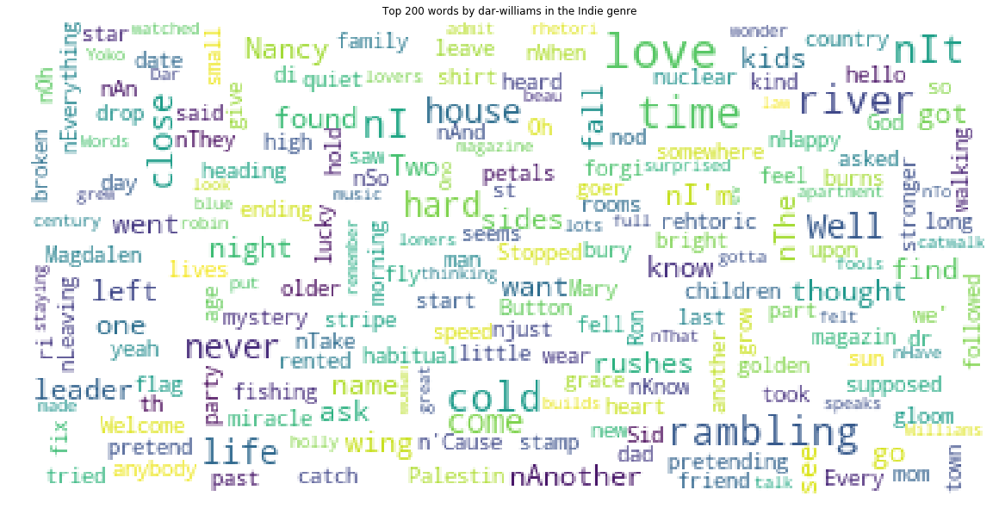

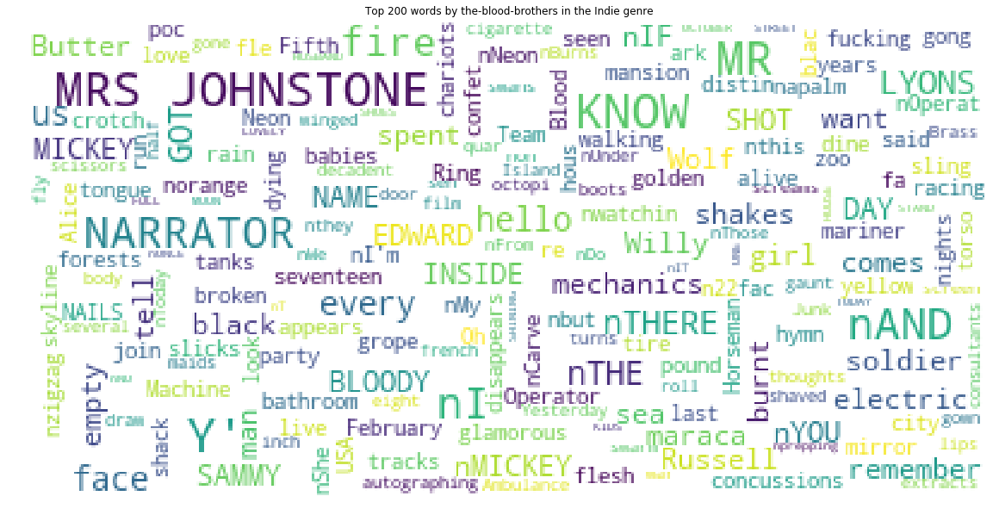

In [20]:
for ix, best_artist_genre_df in enumerate(best_artist_genre_dfs):
    import numpy as np
    import pandas as pd 
    import matplotlib as mpl
    import matplotlib.pyplot as plt
    %matplotlib inline

    from subprocess import check_output
    from wordcloud import WordCloud, STOPWORDS

    mpl.rcParams['figure.figsize']=(20.0,20.0)
    mpl.rcParams['font.size']=10                 
    mpl.rcParams['savefig.dpi']=800             
    mpl.rcParams['figure.subplot.bottom']=.1 


    stopwords = set(STOPWORDS)
    stopwords = stopwords.union(['Beyonc', 'David', 'Bowie', 'Riley', 'Dolly', 'Parton', 'Instrumental', 'INSTRUMENTAL'])

    wordcloud = WordCloud(
                              background_color='white',
                              stopwords=stopwords,
                              max_words=200,
                              max_font_size=20, 
                              random_state=42
                             ).generate(str(best_artist_genre_df['lyrics']))

    print(wordcloud)
    fig = plt.figure(1)
    plt.imshow(wordcloud)
    plt.axis('off')
    genre_dict = {0:0,1:0,2:0,3:1,4:1,5:1,6:2,7:2,8:2,9:3,10:3,11:3,12:4,13:4,14:4,15:5,16:5,17:5,18:6,19:6,20:6,
                 21:7,22:7,23:7,24:8,25:8,26:8,27:9,28:9,29:9,30:10,31:10,32:10,33:11,34:11,35:11,36:12,37:12,38:12}
    genre_ix = genre_dict[ix]
    plt.title('Top 200 words by ' + best_artist_genre_df['artist'].unique()[0] + ' in the ' + df['genre'].unique()[genre_ix] + ' genre')
    plt.show()

In [21]:
best_artist_genre_dfs[0]['artist'].unique()[0]

'barbra-streisand'